# Mini-project in Sample-Effcient Probabilistic Machine Learning

## This lab is written by Masoud Moghaddasi.

In [1]:
# The fundamental package for scientific computing with Python
import numpy as np

# A comprehensive library for creating static, animated, and interactive visualizations in Python.
from matplotlib import pyplot as plt

# we use the following for plotting figures in jupyter
%matplotlib inline

# GPyTorch: Gaussian processes library implemented in PyTorch
import gpytorch
from gpytorch.kernels import ScaleKernel, RBFKernel, CosineKernel, PeriodicKernel, MaternKernel

# An advanced Machine Learning library. This library is required for using GpyTorch
import torch

# Bayesian Optimization in PyTorch for Active Sampling
import botorch
from botorch.optim.fit import fit_gpytorch_torch
from botorch.acquisition import qNegIntegratedPosteriorVariance
from botorch.optim import optimize_acqf
from botorch.fit import fit_gpytorch_model
from botorch.models import SingleTaskGP

# Higher-order functions and operations on callable objects
from functools import partial

# Library for plotting in 3D
import plotly.graph_objects as go

## Helper Functions


## The Branin Function and Observation Generation Functions

In the following cell the vectorized Branin-Hoo function is implemented. Vectorized term means that it accepts the array inputs instead of float numbers and returns the output considering the shape of the inputs. This function is defined by:

$$
    f(\mathbf{x}) = a(x_2 - bx_1^2 + cx_1 - r)^2 + s(1-t)\cos(x_1) + s,
$$

with paremeters:
$$
    a = 1, \quad b = \frac{5.1}{4\pi^2}, \quad c=\frac{5}{\pi}, \quad r = 6, \quad s = 10, \quad t=\frac{1}{8\pi}.
$$

After implementing the Branin-Hoo function, $N=20$ observations using uniform sampling over the space:

$$
\Omega = [-5, 10] \times [0, 15]
$$

are generated.

In [2]:
# Vectorizing the Branin function
@partial(np.vectorize, excluded=list(range(2,8)), signature='(),()->()')
# Define Branin function
def f(x1:float, x2:float, a=1., b=5.1/(4*np.pi**2), c=5/np.pi, r=6., s=10., t=1./(8*np.pi)): 
    """ Branin-Hoo function in two-dimensions as latent function

    Parameters
    ----------
    x1: float
        first input
    x2: float
        second input
    a: float
        model parameter
    b: float
        model parameter
    c: float
        model parameter
    r: float
        model parameter
    s: float
        model parameter
    t: float
        model parameter

    Returns
    -------
    output: float
        the quantity of the Branin-Hoo function for x1 and x2 as input

    """
    return a*(x2 - b*x1**2 + c*x1 - r)**2 + s*(1-t)*np.cos(x1) + s
    
# Define the function space
omega = lambda xLim, yLim, xRes=50, yRes=50: np.meshgrid(np.linspace(*xLim, xRes), np.linspace(*yLim, yRes))
Xi, Xj = omega([-5,10], [0,15])

# Defining some samples
Xsi, Xsj = np.meshgrid(np.linspace(-4.5, 9.5, 5), np.linspace(0.5, 14.5, 4))

# Creation of the bservations using sampled data in previous line
y = f(Xsi, Xsj).reshape(-1)

### Plots

In [3]:
# Plot the Branin function in a 3D interactive form
fig = go.Figure(go.Surface(contours = {"z": {"show": True, "start": 0, "end": 300, "size": 10, "color":"white"}},
                           x = Xi, 
                           y = Xj,
                           z=f(Xi, Xj)))

# Plot the sampled data in a 3D interactive form
fig.add_trace(go.Scatter3d(x = Xsi.reshape(-1),
                           y = Xsj.reshape(-1),
                           z = y,
                           mode='markers',
                           marker=dict(size=6,
                                       color='red',               
                                       opacity=0.8),
                           name="Observations"))

# Updating the plot properties
fig.update_layout(showlegend=True,
                  legend=dict(yanchor="top",
                              y=0.99,
                              xanchor="right",
                              x=1),
                  scene = {"xaxis": {"nticks": 16, "title":"X1"},
                           "yaxis": {"nticks": 16, "title":"X2"},
                           "zaxis": {"nticks": 20, "title":"f"},
                           "camera_eye": {"x": 1, "y": 1, "z": 1},
                           "aspectratio": {"x": 0.8, "y": 0.8, "z": 0.8}},
                  title='Branin-Hoo function')

fig.show()

### Helper Function for Calculation of Predictions and Confidence Intervals

This function calculates the corresponding predictions, the lower and upper bounds of the confidence interval by making a grid of samples. The inputs are the trained model, space boundaries, and the number of samples. It returns three NumPy arrays.

In [4]:
def helper_prediction_confidence(model, space: list =[[-5, 10], [0, 15]], pointNum: list =[100, 100]):
    """ Helper function for calculating the prediction, lower and upper bounds vectors

    Parameters
    ----------
    model: GPytorch trained model
    
    space: list
    a list of two lists containing the upper and lower bounds of the intervals
    
    pointNum: list
    a list of two amounts for the sample numbers in the grid for x1 and x2
    Returns
    -------
    prediction: numpy array
        the prediction vector for the defined grid 
        
    lb: numpy array
        lower bounds of the confidence interval for the defined grid 
        
    ub: numpy array
        upper bounds of the confidence interval for the defined grid 

    """
    
    # Creation of a grid of 1e4 points
    Xnewi, Xnewj = omega(*space, *pointNum)
    Xnew = torch.tensor(np.vstack((Xnewi.ravel(), Xnewj.ravel())).T)

    f_preds = model(Xnew) # Returns the GP latent function at Xnew


    # Calculation of the covariance, and mean of the gaussian function
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        f_mean = f_preds.mean
        f_covar = f_preds.covariance_matrix

    # Reversing the normalization which was applied to the observations
    f_mean = f_mean * train_std + train_mean
    f_covar = f_covar * (train_std**2)

    # Calsulation of the 95% confidence interval 
    lb = f_mean.detach().numpy() - 1.96*np.sqrt(np.diag(f_covar.detach().numpy()))
    prediction = f_mean.detach().numpy()
    ub = f_mean.detach().numpy() + 1.96*np.sqrt(np.diag(f_covar.detach().numpy()))
    return prediction, lb, ub 

## Task 1 (estimating f):

Using GPyTorch, a GP that is the summation of two kernels, RBF and Cosine, over the two different inputs. Considering the observations, the trend is smooth, and some correlation between the close samples can be seen. This correlation reduces by the increment in the distances between the samples. 

### Data pre-processing: type conversion and normalization

In [5]:
# Changing the data from numpy array to torch tensors
train_x = torch.from_numpy(np.vstack((Xsi.ravel(), Xsj.ravel())).T)
train_y = torch.from_numpy(y)

# Normalization of the training output
train_mean = train_y.mean()
train_std = train_y.std()
train_y = (train_y-train_mean)/train_std

# Changing the data from numpy array to torch tensors
test_x = torch.from_numpy(np.vstack((Xi.ravel(), Xj.ravel())).T)
test_y = torch.from_numpy(f(Xi, Xj).reshape(-1))

# Normalization of the testing output using train mean and standard deviation
test_y = (test_y-train_mean)/train_std

### Fitting a GP Model on the Observations

In [6]:
# Training iteration for optimizing the model
training_iter = 2000

# Creation of a class for GP model
class GPModel1(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(GPModel1, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = ScaleKernel(RBFKernel(active_dims=[0,1]))
        
    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

# initialize likelihood and model
likelihood = gpytorch.likelihoods.GaussianLikelihood()
model = GPModel1(train_x, train_y, likelihood)

# Find optimal model hyperparameters
model.train()
likelihood.train()

# Use the adam optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.9)

# "Loss" for GPs - the marginal log likelihood
mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

for i in range(training_iter):
    # Zero gradients from previous iteration
    optimizer.zero_grad()
    # Output from model
    output = model(train_x)
    # Calc loss and backprop gradients
    loss = -mll(output, train_y)
    loss.backward()
    if i%200 == 0:
        print('Iter %d/%d - Loss: %.3f   noise: %.3f' % (i + 1, training_iter, loss.item(),
                                                         model.likelihood.noise.item()))
    optimizer.step()

Iter 1/2000 - Loss: 1.425   noise: 0.693
Iter 201/2000 - Loss: 0.630   noise: 0.000
Iter 401/2000 - Loss: 0.626   noise: 0.000
Iter 601/2000 - Loss: 0.624   noise: 0.000
Iter 801/2000 - Loss: 0.624   noise: 0.000
Iter 1001/2000 - Loss: 0.624   noise: 0.000
Iter 1201/2000 - Loss: 0.624   noise: 0.000
Iter 1401/2000 - Loss: 0.624   noise: 0.000
Iter 1601/2000 - Loss: 0.624   noise: 0.000
Iter 1801/2000 - Loss: 0.624   noise: 0.000


### Plots

In [7]:
# Get into evaluation (predictive posterior) mode
model.eval()  

f_preds = model(test_x) # Returns the GP latent function at test_x

# Calculation of the variance, covariance, and mean of the gaussian function
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    f_mean = f_preds.mean
    f_var = f_preds.variance
    f_covar = f_preds.covariance_matrix


# Reversing the normalization which was applied to the observations
f_mean = f_mean * train_std + train_mean
f_var = f_preds.variance * (train_std**2)

# Plotting the results
fig = go.Figure(go.Surface(contours = {"z": {"show": True, "start": 0, "end": 300, "size": 10, "color":"white"}},
                           x = Xi, 
                           y = Xj,
                           z=f_mean.detach().numpy().reshape(50,50)))

# Plot the sampled data in a 3D interactive form
fig.add_trace(go.Scatter3d(x = model.train_inputs[0][:,0],
                           y = model.train_inputs[0][:,1],
                           z = model.train_targets* train_std + train_mean,
                           mode='markers',
                           marker=dict(size=6,
                                       color='red',               
                                       opacity=0.8),
                           name="Sampled Observations"))

# Updating the plot properties
fig.update_layout(showlegend=True,
                  legend=dict(yanchor="top",
                              y=0.99,
                              xanchor="right",
                              x=1),
                  scene = {"xaxis": {"nticks": 16, "title":"X1"},
                           "yaxis": {"nticks": 16, "title":"X2"},
                           "zaxis": {"nticks": 20, "title":"f"},
                           "camera_eye": {"x": 1, "y": 1, "z": 1},
                           "aspectratio": {"x": 0.8, "y": 0.8, "z": 0.8}},
                  title='Approximated Branin-Hoo function')
fig.show()

### Choosing hyperparameters

The mean function and kernel contain some parameters which are called prior hyperparameters ($\eta$). To choose the hyperparameters, three approaches are typically considered.
The first is to find the maximum likelihood estimate (MLE). In this approach, when given observations $f(x_{1:n})$, the likelihood of these observations under the prior is defined by $P(f(x_{1:n})\mid \eta)$ (the notation is modified to indicate its dependence on $\eta$). This likelihood is a multivariate normal density, and $\eta$ is the variable to be optimized by maximizing this likelihood,

\begin{equation}
\begin{split}
\hat{\eta} = argmax P(f(x_{1:n}) \mid \eta )
\end{split}
\end{equation}

In the second approach, a prior, $P(\eta)$ is considered. Then $\eta$ is estimated by the maximum a posteriori (MAP) estimate which is the value of $\eta$ that maximizes the posterior,

\begin{equation}
\begin{split}
\hat{\eta} = argmax P(\eta \mid f(x_{1:n})) = argmax P(f(x_{1:n}) \mid \eta )P(\eta)
\end{split}
\end{equation}

In moving from the first expression to the second the Bayes' rule is applied and then a normalization constant is dropped
$\int P(f(x_{1:n})\mid \eta^\prime)P(\eta^\prime) d\eta^\prime$. This amount does not depend on the quantity $\eta$. It can be considered thath the MLE is a special case of the MAP if the prior on the hyperparameters $P(\eta)$ is taken to be the
probability distribution that has constant density over the domain of $\eta$. The MAP is useful if the MLE sometimes estimates unreasonable hyperparameter values, for example, corresponding to functions that vary too quickly or too slowly. By choosing a prior that puts more weight on hyperparameter values that are reasonable for a particular problem, MAP estimates can better correspond to the application. Common choices for the prior include the uniform distribution (for preventing estimates from falling outside of some pre-specified range), the normal distribution (for suggesting that the estimates fall near some nominal value without setting a hard cutoff), and the lognormal and truncated normal distributions (for providing a similar suggestion for positive parameters). 

The third approach is called the fully Bayesian approach. In this approach, we wish to compute the posterior distribution on $f(x)$ marginalizing over all possible values of the hyperparameters,

\begin{equation}
\begin{split}
P(f(x)=y \mid f(x_{1:n}) ) = \int P(f(x) = y \mid f(x_{1:n}), \eta) P(\eta \mid f(x_{1:n}))d \eta
\end{split}
\end{equation}

This integral is typically intractable, but it can be approximated through sampling:

\begin{equation}
\begin{split}
P(f(x)=y \mid f(x_{1:n}) ) = \frac{1}{J} \sum_{j=1}^J P(f(x)=y \mid f(x_{1:n}), \eta = \hat{\eta}_j)
\end{split}
\end{equation}

where $(\hat{\eta}j : j = 1, \cdots, J)$ are sampled from $P(\eta \mid f(x{1:n}))$ via an MCMC method, e.g., slice sampling. MAP estimation can be seen as an approximation to fully Bayesian inference: if we approximate the posterior $P(\eta \mid f(x_{1:n}))$ by a point mass at the $\eta$ that maximizes the posterior density, then inference with the MAP recovers [1].

[1] Frazier, Peter I. "A tutorial on Bayesian optimization." arXiv preprint arXiv:1807.02811 (2018).


**Here, I wanted to train a fully Bayesian model, so I used marginalization over the posterior approach**

## Task 2 (Estimating q):

### a) 
Use the original 20 observations to calculate an approximate estimate of the probabilty that $f(X) > 190$.

In [8]:
# Calcualation of an approximation of the probability using 20 points
np.sum(y > 190) / len(y)

0.1

### b) 
Compute the probability that the best predictor of your GP is greater than the threshold ($190$), with confidence intervals. How does your estimation compare with the true value: $P(f(X) > 190) = 1.94\times 10^{−2}$.

First, we calculate an approximation of the true probability using the Branin-Hoo function itself.

In [9]:
# Creation of a grid of 1e6 points
Xnewi, Xnewj = omega([-5,10], [0,15], 1000, 1000)

#calculation of the real function values for the whole grid
f_real = f(Xnewi, Xnewj).reshape(-1) 

# Estimation of the probability using the points
print('True Value: ',np.sum(f_real > 190) / len(f_real))

True Value:  0.019621


The amount is almost equal to the true value in the question. Now, with the same method but with only 1e4 data points and using the GP approximation, the requested probability is calculated.

In [10]:
# Calculating the predictions and confidence intervals
prediction, lb, ub  = helper_prediction_confidence(model, [[-5,10], [0,15]], [100, 100])

# Calculation and printing the requested probability for the mean, lower, and upper bounds of the GP
print('Lower bound: ',np.sum(lb > 190) / len(lb))
print('Estimation: ',np.sum(prediction > 190) / len(prediction))
print('Upper bound: ',np.sum(ub > 190) / len(ub))

Lower bound:  0.0224
Estimation:  0.0259
Upper bound:  0.0298


The calculated amounts are more closer to the real value rather than the approximation which was made with only the 20 observations. It is noticable that the true value is not in the confidence interval.

## Task 3 (Active Sampling):
In this task, three approaches for Active Sampling are discussed. Active Sampling is a procedure with which the training set for GP approximation is chosen according to a criterion. This criterion is implemented in an acquisition function that decides the next sampling point. These sample points can be achieved with two possibilities. The first possibility is requesting the selected samples parallelly from the system. It means, when the acquisition function decides about the next sampling point, this sampling point is given to the system, and the system returns the corresponding output amount, which is probably noisy. The other possibility, which is more realistic, is that we have a set of the possible training set, and we choose among these candidates set. In the following, two acquisition function will be discussed.

### 1. Expected Prediction Error 
The goal of this method is to strengthen the model at the place where it makes the largest prediction error. As a result,a learning function is required that can estimate the prediction errors of the unseen samples.

The prediction error can be defined as 

\begin{equation}
L(x) = (y(x)-M(x))^2,
\end{equation}

where $y(x)$ and $M(x)$ are the true function value and model prediction value for sample $x$, respectively. According to the bias-variance decomposition, the expected value of $L(x)$ can be written as 

\begin{equation}
E[L(x)] = \underbrace{(y(x)-E[M(x)])^2}_{\text{bias}^2} + \underbrace{var[M(x)]}_{\text{variance}}
\end{equation}

However, computing $E[L(x)]$ is not straight-forward, but the variance value can be simply obtained by model prediction variance. Calculating the true bias value is impossible, because the true function output $y(x)$ is unknown. Hence, we need to estimate the true bias value for an unseen sample $x$. Here, this amount is calculated using leave-one-out cross-validation error with the following steps:

1. Calculate the cross-validation errors for all the training samples $x_i, i=1,...,N$

\begin{equation}
e_{CV}^2(x_i) = (y(x_i)-M_{-i}(x_i))^2,
\end{equation}

where $y(.)$ is the true sample label and $M_{-i}(.)$ is the model trained using all the training samples except $(x_i, f(x_i))$.

2. Find the closest training samples $x_i$ to $x^{\ast}$, and use its cross-validation error as approximation of the prediction bias at $x^{\ast}$:

\begin{equation}
\text{bias}(x^{\ast}) = e_{CV}^2(x_i), \; \underset{i}{\text{min}}|x^{\ast}-x_i|
\end{equation}

3. calculate the expected prediction error $E[L(x)]$ [2].

[2] https://towardsdatascience.com/reducing-model-training-cost-with-active-learning-255b40a2aa98

In [11]:
# use a GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [12]:
# Making a class for GP Model
class GPModel1(SingleTaskGP):
    def __init__(self, train_x, train_y, likelihood):
        super(GPModel1, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = ScaleKernel(RBFKernel(active_dims=[0,1]))#+ScaleKernel(CosineKernel(active_dims=[0]))

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

# initialize likelihood and model
likelihood = gpytorch.likelihoods.GaussianLikelihood()


#### Custom Acquisition Function for Expected Prediction Error Method

In [13]:
def CV_scores(model):
    """ Helper function for calculating the prediction, lower and upper bounds vectors

    Parameters
    ----------
    model: GPytorch trained model
    
    Returns
    -------
    CV_Score: numpy array
        a vector containing the bias**2 caused by removing each training point in the place of that training point 

    """
    
    # each training point removes from the list and a model is fitted on the ramining samples and then
    # the bias caused by this removal for the same training point is calculated. In the end, the bias 
    # raised to the power 2.
    CV_Score = torch.zeros((model.train_inputs[0].shape[0]))
    for i, test_temp in enumerate(model.train_inputs[0]):
        ind = list(range(model.train_inputs[0].shape[0]))
        ind.remove(i)
        train_x_temp = model.train_inputs[0][ind]
        train_y_temp = model.train_targets[ind,None]
        model_temp = GPModel1(train_x_temp, train_y_temp, likelihood)

        # "Loss" for GPs - the marginal log likelihood
        mll_temp = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model_temp)
        mll_temp.train()

        fit_gpytorch_torch(mll_temp, options ={"maxiter":5000, "disp": False, "lr": 0.9})
        model_temp.eval()
        f_pred = model_temp(test_temp[None,:]).mean
    
        CV_Score[i] = (f_pred.detach() - model.train_targets[i])**2
        
    return CV_Score

def acquisition(candidates: torch.tensor, model, CV_Score: torch.tensor):
    
    """ Helper function for calculating the prediction, lower and upper bounds vectors

    Parameters
    ----------
    candidates: torch tensor
        the candidate sample(s) for calculation of the expected prediction error (EPE)  
    
    model: GPytorch trained model
    
    CV_Score: numpy array
        a vector containing the bias**2 caused by removing each training point in the place of that training point 
    
    
    Returns
    -------
    EPE: numpy array
        a vector containing the EPE(s) for the candidate(s)

    """
    
    #finding the nearest train point to each candidate(s)
    ind = torch.argmin(torch.cdist(candidates,model.train_inputs[0]),axis=1)
    
    # calculation of the variance for each candidate(s) from the trained model
    model.eval()
    pred = model(candidates)
    var = pred.variance.detach()

    return CV_Score[ind] + var

#### Sequential Active Sampling and Optimization of the Model

In this problem, the acquisition function has some jumps in the space and is not differentiable. Hence, heuristic-search-based methods are recommended. Here, since the computation complexity is not too high a fully grid search is implemented. 
In this problem, I assumed that we have some observations that are used as candidates. The model is initialized with two samples, and 14 more samples are chosen according to the EPE acquisition function from the candidate list (in the code the amount of iterations is 15, but the last sample is not contributed to the model training). In total, the model is trained with 16 samples.

In [14]:
# generation of two initial sample points (These points have an important role on the convergance rate of the method.
# By selecting a good! initial point the method converges faster.)
Xsi = np.array([-5.,10.])
Xsj = np.array([0.,15.])
train_x = torch.from_numpy(np.vstack((Xsi, Xsj)).T)
train_y = torch.from_numpy(f(Xsi, Xsj).reshape(-1,1))

# Creation of candidates list
Xci, Xcj = np.meshgrid(np.linspace(-5., 10., 200), np.linspace(0., 15., 200))
Candidates = torch.from_numpy(np.vstack((Xci.ravel(), Xcj.ravel())).T)

EPE = np.zeros(15)
for Iter in range(len(EPE)):
    
    # Normalization of the train observation according to the current training data, Here we could train with all
    # the candidates list, but for the sake of transferability to the parallel sampling from the system, I decided 
    # to use the available training samples, not all the candidates list.
    train_mean = train_y.mean()
    train_std = train_y.std()
    train_y = (train_y-train_mean)/train_std
    
    # Instantiating a model out of the class GPModel1
    model = GPModel1(train_x, train_y, likelihood)

    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)
    mll.train()
    
    # Optimizing the model using fit_gpytorch_torch function from botorch library
    fit_gpytorch_torch(mll, options ={"maxiter": 5000, "disp": False, "lr": 0.9})
    CV_Score = CV_scores(model)
    
    # defining an acquisition function from the custom acuisition function
    acquisitionFunction = lambda candidates: acquisition(candidates, model, CV_Score) 
    
    # grid search in the candidates list
    EPE_temp = acquisitionFunction(Candidates)
    
    # finding the maximum amount of the EPE and the corresponding sample
    ind = torch.argmax(EPE_temp)
    
    # selecting the new sample according to the grid search
    new_point = Candidates[None,ind]

    print('New Point: ', new_point.numpy()[0],  'EPE: ', EPE_temp[ind].numpy() )

    # adding the new sample and the corresponding observation to the training samples for the next iteration
    EPE[Iter] = EPE_temp[ind].numpy()
    train_x = torch.cat((train_x,new_point),axis=0)
    train_y = torch.cat((train_y* train_std + train_mean,torch.tensor(f(*new_point.detach().numpy()[0])).reshape(1,1)),axis=0)

New Point:  [-0.85427136  0.        ] EPE:  2.6510124802589417
New Point:  [-4.92462312  0.        ] EPE:  3.9501672983169556
New Point:  [-2.88944724 12.88944724] EPE:  4.272015333173318
New Point:  [4.57286432 7.46231156] EPE:  3.167256188504669
New Point:  [-5.          6.55778894] EPE:  3.392746262614727
New Point:  [-5.          3.24120603] EPE:  3.8936279780399925
New Point:  [10.  0.] EPE:  3.346013050833463
New Point:  [4.57286432 1.50753769] EPE:  2.2734164165010204
New Point:  [10.          5.65326633] EPE:  2.1426908126340853
New Point:  [ 3.36683417 15.        ] EPE:  1.447745140228287
New Point:  [-0.02512563  5.05025126] EPE:  1.3351604121961178
New Point:  [-5. 15.] EPE:  1.6312166480001618
New Point:  [ 6.6080402  11.68341709] EPE:  1.054253790277221
New Point:  [2.01005025 0.        ] EPE:  0.49998306501601575
New Point:  [10.        11.6080402] EPE:  0.4776017148118312


#### Plots

This plot is generated to give a sense of the training trend. In actual problems, this graph can be a criterion for the stop point of the sampling. If the final error is significantly small (smaller enough than the initial error), or it doesn't change anymore, the sampling action can be stopped. 

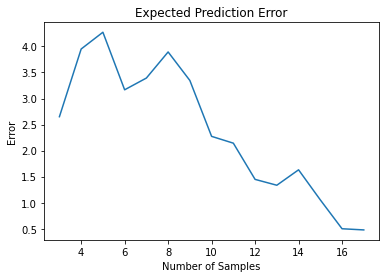

In [15]:
plt.plot(list(range(3,3+len(EPE))), EPE)
plt.title('Expected Prediction Error')
plt.xlabel('Number of Samples')
plt.ylabel('Error')
plt.grid('')

The following plot is made for the whole candidate list after the last optimization iteration. In every iteration, the sample corresponding to the maximum of the EPE amounts (something like the following graph) is chosen as a new training sample. In the following graph, the jumps mentioned at the beginning of this section can be observed. These jumps that make the function non-differentiable, are caused by changing the bias approximation sample since it is calculated with the closest training sample.

In [16]:
# Plotting the Acquisition function for the last point
fig = go.Figure(go.Surface(contours = {"z": {"show": True, "start": 0, "end": 300, "size": 10, "color":"white"}},
                            x = Xci, 
                            y = Xcj,
                            z=EPE_temp.reshape(len(Xj[:,0]),-1)))

# Updating the plot properties
fig.update_layout(showlegend=True,
                  legend=dict(yanchor="top",
                              y=0.99,
                              xanchor="right",
                              x=1),
                  scene = {"xaxis": {"nticks": 16, "title":"X1"},
                           "yaxis": {"nticks": 16, "title":"X2"},
                           "zaxis": {"nticks": 20, "title":"Error"},
                           "camera_eye": {"x": 1, "y": 1, "z": 1},
                           "aspectratio": {"x": 0.8, "y": 0.8, "z": 0.8}},
                  title='Expected Prediction Error for the Last Point')
fig.show()

The result of the trained model by 16 samples are shown in the following plot. Also, the sampled points can be seen in this graph by red points.

In [17]:
# Creation of a grid of 1e4 points
Xnewi, Xnewj = omega([-5,10], [0,15], 100, 100)
Xnew = torch.tensor(np.vstack((Xnewi.ravel(), Xnewj.ravel())).T)

# Get into evaluation (predictive posterior) mode
model.eval() 

f_preds = model(test_x) # Returns the GP latent function at test_x
y_preds = likelihood(model(test_x)) # Returns the (approximate) predictive posterior distribution at test_x

# generating the predictions
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    f_mean = f_preds.mean
    f_covar = f_preds.covariance_matrix

# Reversing the normalization 
f_mean = f_mean * train_std + train_mean
f_covar = f_covar * (train_std**2)

# plotting the obtained model
fig = go.Figure(go.Surface(contours = {"z": {"show": True, "start": 0, "end": 300, "size": 10, "color":"white"}},
                            x = Xi, 
                            y = Xj,
                            z=f_mean.detach().numpy().reshape(50,50)))

# plotting the sampled data in a 3D interactive form
fig.add_trace(go.Scatter3d(x = model.train_inputs[0][:,0],
                           y = model.train_inputs[0][:,1],
                           z = model.train_targets* train_std + train_mean,
                           mode='markers',
                           marker=dict(size=6,
                                       color='red',               
                                       opacity=0.8),
                           name="Sampled Observations"))

# Updating the plot properties
fig.update_layout(showlegend=True,
                  legend=dict(yanchor="top",
                              y=0.99,
                              xanchor="right",
                              x=1),
                  scene = {"xaxis": {"nticks": 16, "title":"X1"},
                           "yaxis": {"nticks": 16, "title":"X2"},
                           "zaxis": {"nticks": 20, "title":"f"},
                           "camera_eye": {"x": 1, "y": 1, "z": 1},
                           "aspectratio": {"x": 0.8, "y": 0.8, "z": 0.8}},
                  title='Approximated Branin-Hoo function')
fig.show()

In [18]:
# Calculating the predictions and confidence intervals
prediction, lb, ub  = helper_prediction_confidence(model, [[-5,10], [0,15]], [100, 100])

# Calculation and printing the requested probability for the mean, lower, and upper bounds of the GP
print('Lower bound: ',np.sum(lb > 190) / len(lb))
print('Estimation: ',np.sum(prediction > 190) / len(prediction))
print('Upper bound: ',np.sum(ub > 190) / len(ub))

Lower bound:  0.0153
Estimation:  0.0197
Upper bound:  0.0472


According to the results (current results show an estimation of 0.0197 and 0.0153 and 0.0472 as Lower and Upper bounds, respectively), the estimation is improved by this method rather than 0.1 of the simple Monte Carlo and 0.0259 of the uniform sampling method. However, the variance of the estimation or in other words the confidence interval is wider. This can be caused because of less number of samples, and the fact that the normal samples also were a good training set, probably by chance.

### 2. Negative Integrated Posterior Variance

In this method, we assume that the model is true, then in:

\begin{equation}
E[L(x)] = \underbrace{(y(x)-E[M(x)])^2}_{\text{bias}^2} + \underbrace{var[M(x)]}_{\text{variance}}
\end{equation}

the bias term is considered as zero. Now we calculate the amount of the integrated prediction variance by adding a new sample. For the calculation, please look at [3]. Now the objective will be to find a new sample that makes the prediction variance the lowest amount among the other candidate samples by placing it in the training set. 
Here, for implementing this acquisition function, I used the botorch library in which we have "qNegIntegratedPosteriorVariance" class that calculates this amount. Please note that since their optimizer later finds a maximum amount for the acquisition functions they reversed the sign of the integration over the variance. Moreover, for finding the maximum amount of this acquisition function and its corresponding sample, I used another function from the same library, i.e., "optimize_acqf".
For this acquisition function in total 20 points are considered. Two samples out of 20 are considered as initial points and 18 are found by acquisition function (19 are generated but 18 are used in model fitting). 

[3] Seo, Sambu, et al. "Gaussian process regression: Active data selection and test point rejection." Mustererkennung 2000. Springer, Berlin, Heidelberg, 2000. 27-34.

In [30]:
# generation of two initial sample points (These points have an important role on the convergance rate of the method.
# By selecting a good! initial point the method converges faster.)
Xsi = np.array([-5.,10.])
Xsj = np.array([0.,15.])
train_x = torch.from_numpy(np.vstack((Xsi, Xsj)).T)
train_y = torch.from_numpy(f(Xsi, Xsj).reshape(-1,1))

for Iter in range(19):
    
    # Normalizing the training bservations according to the currently available samples
    train_mean = train_y.mean()
    train_std = train_y.std()
    train_y = (train_y-train_mean)/train_std

    # Creation of a grid of 1e4 points as MC points for approxmation of the integration over the variance
    Xmci, Xmcj = omega([-5,10], [0,15], 100, 100)
    Xmc = torch.tensor(np.vstack((Xmci.ravel(), Xmcj.ravel())).T)
   
    # instantiating a model from GPModel1 class
    model = GPModel1(train_x, train_y, likelihood)

    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)
    mll.train()
    
    # optimizing the current model's parameters
    fit_gpytorch_torch(mll, options ={"maxiter": 2000, "disp": False, "lr": 0.9})

    # instantiating the acquisition function object from the corresponding class
    qnipv = qNegIntegratedPosteriorVariance(
    model=model, 
    mc_points= Xmc)
    
    # finding the sample corresponding to the maximum of the acquisition function usning optimize_acqf method from botorch
    new_point, _ = optimize_acqf(
        acq_function=qnipv,
        bounds=torch.tensor([[-5.0, 0.0], [10.0, 15.0]]),
        q=1,
        num_restarts=50,
        raw_samples=1000,
        options={},
    )
    
    print('New Point: ', new_point[0].numpy(), 'Observation: %.3f   NIPV: %.3f' % (f(*new_point[0]), qnipv(new_point).detach().numpy()[0]))
    
    # including the new sample in the training set
    train_x = torch.cat((train_x,new_point),axis=0)
    train_y = torch.cat((train_y* train_std + train_mean,torch.as_tensor(np.array([[f(*new_point.detach()[0])]]))),axis=0)

New Point:  [3.3196764 8.044757 ] Observation: 35.413   NIPV: -0.563
New Point:  [-0.9957452  4.2553983] Observation: 27.176   NIPV: -2.144
New Point:  [-1.1416147 11.276229 ] Observation: 24.826   NIPV: -0.779
New Point:  [4.8821335 3.6550252] Observation: 17.126   NIPV: -0.761
New Point:  [7.8480544 8.60454  ] Observation: 61.013   NIPV: -0.227
New Point:  [ 3.4760823 12.969502 ] Observation: 120.633   NIPV: -0.156
New Point:  [7.223819  2.9063458] Observation: 18.421   NIPV: -0.048
New Point:  [-4.0406046  5.992901 ] Observation: 77.076   NIPV: -0.015
New Point:  [3.9054222 1.5812265] Observation: 3.096   NIPV: -0.013
New Point:  [-3.4655905 13.452332 ] Observation: 1.046   NIPV: -0.007
New Point:  [ 0.24764709 13.301586  ] Observation: 78.412   NIPV: -0.006
New Point:  [8.168172  5.1448393] Observation: 19.464   NIPV: -0.003
New Point:  [-1.9483782  1.5042427] Observation: 71.861   NIPV: -0.004
New Point:  [9.164424  1.7206233] Observation: 1.017   NIPV: -0.007
New Point:  [ 2.4352

### Plots

The following plot is made for the whole MC points after the last optimization iteration. In every iteration, the sample corresponding to the maximum of the "NIPV" amounts (something like the following graph) is chosen as a new training sample.

In [31]:
# Creation of a grid of 1e4 points
Xmci, Xmcj = omega([-5,10], [0,15], 100, 100)

# calculation of the acquisition amount over the grid
Acq = np.zeros((100,100))
for i in range(len(Xmci[1])):
    for j in range(len(Xmcj[0])):
        Xmc = torch.tensor(np.vstack([Xmci[i,j], Xmcj[i,j]]).T)

        Acq[i,j] = qnipv(Xmc)

#plotting the Negative Integrated Posterior Acquisition Function for the last point
fig = go.Figure(go.Surface(contours = {"z": {"show": True, "start": 0, "end": 300, "size": 10, "color":"white"}},
                            x = Xmci, 
                            y = Xmcj,
                            z=Acq))

# Updating the plot properties
fig.update_layout(showlegend=True,
                  legend=dict(yanchor="top",
                              y=0.99,
                              xanchor="right",
                              x=1),
                  scene = {"xaxis": {"nticks": 16, "title":"X1"},
                           "yaxis": {"nticks": 16, "title":"X2"},
                           "zaxis": {"nticks": 20, "title":"f"},
                           "camera_eye": {"x": 1, "y": 1, "z": 1},
                           "aspectratio": {"x": 0.8, "y": 0.8, "z": 0.8}},
                  title='Negative Integrated Posterior Function')
fig.show()

The result of the trained model by 20 samples are shown in the following plot. Also, the sampled points can be seen in this graph by red points.

In [32]:
# Creation of a grid of 1e4 points
Xnew = torch.tensor(np.vstack((Xmci.ravel(), Xmcj.ravel())).T)

# Get into evaluation (predictive posterior) mode
model.eval() 

 # Returns the GP latent function at Xnew
f_preds = model(Xnew)

# generating the predictions
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    f_mean = f_preds.mean
    f_covar = f_preds.covariance_matrix

# Reversing the normalization 
f_mean = f_mean * train_std + train_mean
f_covar = f_covar * (train_std**2)

# plotting the obtained model
fig = go.Figure(go.Surface(contours = {"z": {"show": True, "start": 0, "end": 300, "size": 10, "color":"white"}},
                            x = Xmci, 
                            y = Xmcj,
                            z=f_mean.detach().numpy().reshape(100,100)))

# plottin the sampled data in a 3D interactive form
fig.add_trace(go.Scatter3d(x = model.train_inputs[0].detach()[:,0],
                           y = model.train_inputs[0].detach()[:,1],
                           z = model.train_targets* train_std + train_mean,
                           mode='markers',
                           marker=dict(size=6,
                                       color='red',               
                                       opacity=0.8),
                           name="Sampled Observations"))

# Updating the plot properties
fig.update_layout(showlegend=True,
                  legend=dict(yanchor="top",
                              y=0.99,
                              xanchor="right",
                              x=1),
                  scene = {"xaxis": {"nticks": 16, "title":"X1"},
                           "yaxis": {"nticks": 16, "title":"X2"},
                           "zaxis": {"nticks": 20, "title":"f"},
                           "camera_eye": {"x": 1, "y": 1, "z": 1},
                           "aspectratio": {"x": 0.8, "y": 0.8, "z": 0.8}},
                  title='Approximated Branin-Hoo function')
fig.show()

In [33]:
# Calculating the predictions and confidence intervals
prediction, lb, ub  = helper_prediction_confidence(model, [[-5,10], [0,15]], [100, 100])

# Calculation and printing the requested probability for the mean, lower, and upper bounds of the GP
print('Lower bound: ',np.sum(lb > 190) / len(lb))
print('Estimation: ',np.sum(prediction > 190) / len(prediction))
print('Upper bound: ',np.sum(ub > 190) / len(ub))

Lower bound:  0.0109
Estimation:  0.0151
Upper bound:  0.0364


According to the results (current results show an estimation of 0.0151 and 0.0109 and 0.0364 as Lower and Upper bounds, respectively), the estimation is closer to the true value by this method rather than 0.1 of the simple Monte Carlo and 0.0259 of the uniform sampling method. The aqcuisition methods are sensible to the initial points and it may vary the results, but with a good optimization method over the aquisition function and sampling enough the results can be good enough.